# 3. Fitting diads once you have groups
- Once you have divided your diads into groups based on strengths, you need to tweak the fit parameters for each group
- Then you can loop through all files in a given group and automatically fit the spectra

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib
import DiadFit as pf
pf.__version__

'0.0.88'

## Specifying filetype, and folder as before

In [2]:
# This specifies what file type your Raman exported in. 
meta_path, spectra_path, spectra_filetype, prefix, str_prefix, spectra_file_ext, meta_file_ext, TruPower=pf.get_settings()

## Load in data and fit parameters
- This loads in the dataframes of the fit parameters you saved in the other file, by group
- At this point you select what group you want to fit (batch = 'Weak', 'Medium' or 'Strong'). After running through the entire notebook for one group, come back up here to fit a second group.

In [21]:
## load dataframes and numpy arrays 
np_x = joblib.load('np_x.sav')

# Select the group you want to fit ('Weak', 'Medium', 'Strong'). After selecting one, go through and select another one and run again from here. 
batch='Weak' # Options are Weak, Medium, Strong

if batch=='Weak':
    GroupN_df=joblib.load('Weak_df.sav')
if batch=='Medium':
    GroupN_df=joblib.load('Medium_df.sav')
if batch=='Strong':
    GroupN_df=joblib.load('Strong_df.sav')

### Now load one file from this group to tweak parameters for

In [22]:
Diad_Files =GroupN_df['filename']
i=0


### Lets plot the diad to have a look at it

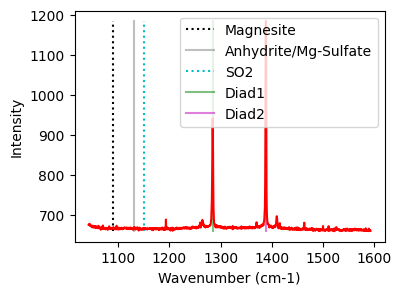

In [23]:
plot1=pf.plot_diad(path=spectra_path, filename=Diad_Files[i], filetype=spectra_filetype)

## Now lets inspect the diads and get their approximate positions
- As with generic peak, you can exclude 2 segments (e.g. around cosmic rays)
- You then specify how many peaks you want to fit on each diad. 1 means just the strong peak, 2 hotbands, and 3 for Diad2 would also fit the C13 peak if present. 
- The identify_diad_peaks then uses scipy findpeaks to identify the positions of the 2 diads, and any other peaks the user asks for. These are saved, and fed into the later functions for peak fitting. 

## Choose a model for fitting all peaks
- Option of Voigt or PseudoVoigt. We recomend PsuedoVoigt

In [6]:
model_name='PseudoVoigtModel'

## Fit Diad 1
- Tweak the parameters in the config files for each group. E.g. how many peaks (fit_peaks), the background positions, the sigma of the diad, and whether or not you want a gaussian background

In [7]:
diad_id_config=pf.diad_id_config(height=50, exclude_range1=[1308, 1309])
diad_id_config

if batch=='Weak':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1250),
    upper_bck_diad1=(1300, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=100, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
    diad1_fit_config_init

if batch=='Medium':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1240),
    upper_bck_diad1=(1315, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=100, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
    diad1_fit_config_init

if batch=='Strong':
    diad1_fit_config_init=pf.diad1_fit_config(
    fit_gauss=True, gauss_amp= 2*GroupN_df['HB1_abs_prom'].iloc[i],
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1220),
    upper_bck_diad1=(1330, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=1000, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
diad1_fit_config_init

diad1_fit_config(model_name='PseudoVoigtModel', fit_peaks=2, N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1250), upper_bck_diad1=(1300, 1350), fit_gauss=False, gauss_amp=1000, diad_sigma=0.6, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, diad_prom=274.3815869948927, HB_prom=nan, x_range_baseline=30, y_range_baseline=100, dpi=200, x_range_residual=10, return_other_params=False)

### See what these fit parameters look like for diad1

,Diad1_Combofit_Cent,Diad1_Voigt_Cent,Diad1_cent_err,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Voigt_Gamma,Diad1_Combofit_Height,Diad1_Residual,Diad1_Prop_Lor,Diad1_fwhm,Diad1_refit,Diad1_Asym50,Diad1_Asym70,Diad1_Yuan2017_sym_factor,Diad1_Remigi2021_BSF,Diad1_PDF_Model
0,1284.51559,1284.51559,0.009991,734.360415,0.960012,0,273.793109,3.878183,0.738369,1.920023,Flagged Warnings:,1.140449,1.200549,0.269666,0.007013,PseudoVoigtModel


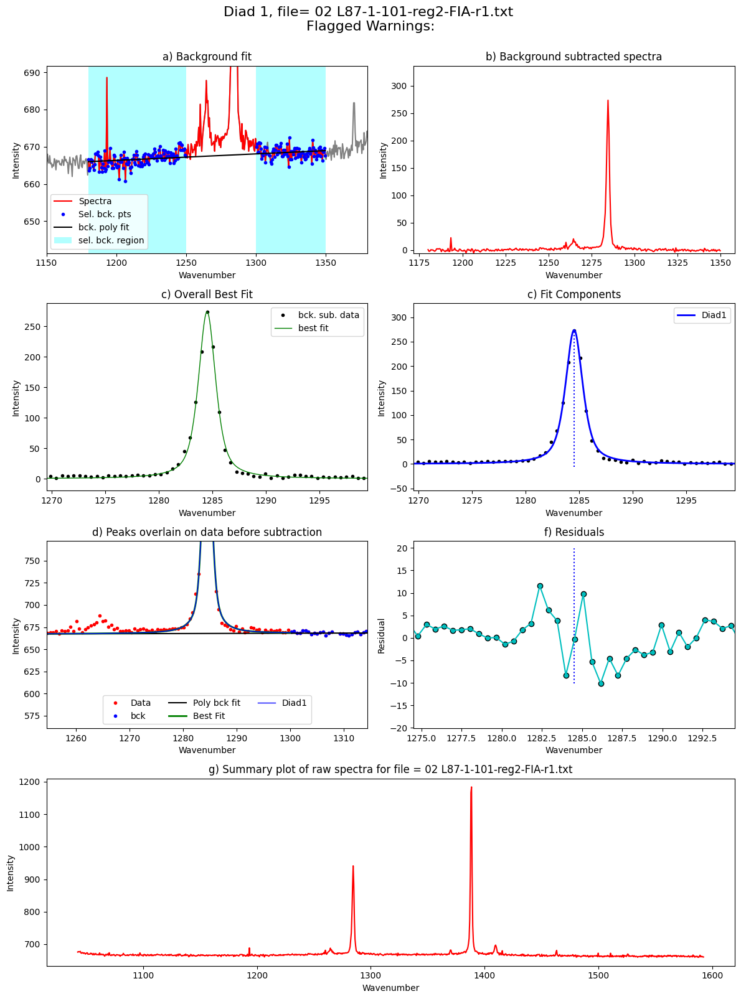

In [8]:
Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config_init,
config2=diad_id_config,
path=spectra_path, filename=Diad_Files.iloc[0],
filetype=spectra_filetype, plot_figure=True, close_figure=False,
Diad_pos=GroupN_df['Diad1_pos'].iloc[i],
HB_pos=GroupN_df['HB1_pos'].iloc[i])
Diad1_fit

### Update the sigma
- The sigma parameter varies quite a lot based on the splitting. Best to update your first guess with what you found for the example file above

In [9]:
diad1_fit_config2=diad1_fit_config_init

## Fit diad2

In [10]:
if batch=='Weak':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=2, upper_bck_diad2=(1430, 1480),
    lower_bck_diad2=(1310, 1360), diad_sigma=0.4,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=100,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i])
    diad2_fit_config_init

if batch=='Medium':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=True, gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i],
    lower_bck_diad2=(1310, 1350), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=100,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i],
    C13_prom=GroupN_df['C13_abs_prom'].iloc[i])
    diad2_fit_config_init

if batch=='Strong':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=True, gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i],
    lower_bck_diad2=(1310, 1340), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=1000,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i],
    C13_prom=GroupN_df['C13_abs_prom'].iloc[i])
    diad2_fit_config_init
diad2_fit_config_init

diad2_fit_config(model_name='PseudoVoigtModel', fit_peaks=2, N_poly_bck_diad2=2, lower_bck_diad2=(1310, 1360), upper_bck_diad2=(1430, 1480), fit_gauss=False, gauss_amp=1000, diad_sigma=0.4, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, diad_prom=553.9846249789903, HB_prom=32.653387693852665, C13_prom=10, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=30, return_other_params=False)

### See what these fit parameters look like for diad2

,Diad2_Combofit_Cent,Diad2_Voigt_Cent,Diad2_cent_err,Diad2_Voigt_Area,Diad2_Voigt_Sigma,Diad2_Voigt_Gamma,HB2_Cent,HB2_Area,HB2_Sigma,Diad2_Combofit_Height,Diad2_Residual,Diad2_Prop_Lor,Diad2_fwhm,Diad2_refit,Diad2_Asym50,Diad2_Asym70,Diad2_Yuan2017_sym_factor,Diad2_Remigi2021_BSF,Diad2_PDF_Model
0,1388.300965,1388.300915,0.003044,1123.267143,0.710694,0,1409.656715,115.745387,1.223831,571.401355,2.254951,0.714977,1.421388,Flagged Warnings:,1.078571,1.10453,0.11168,0.002488,PseudoVoigtModel


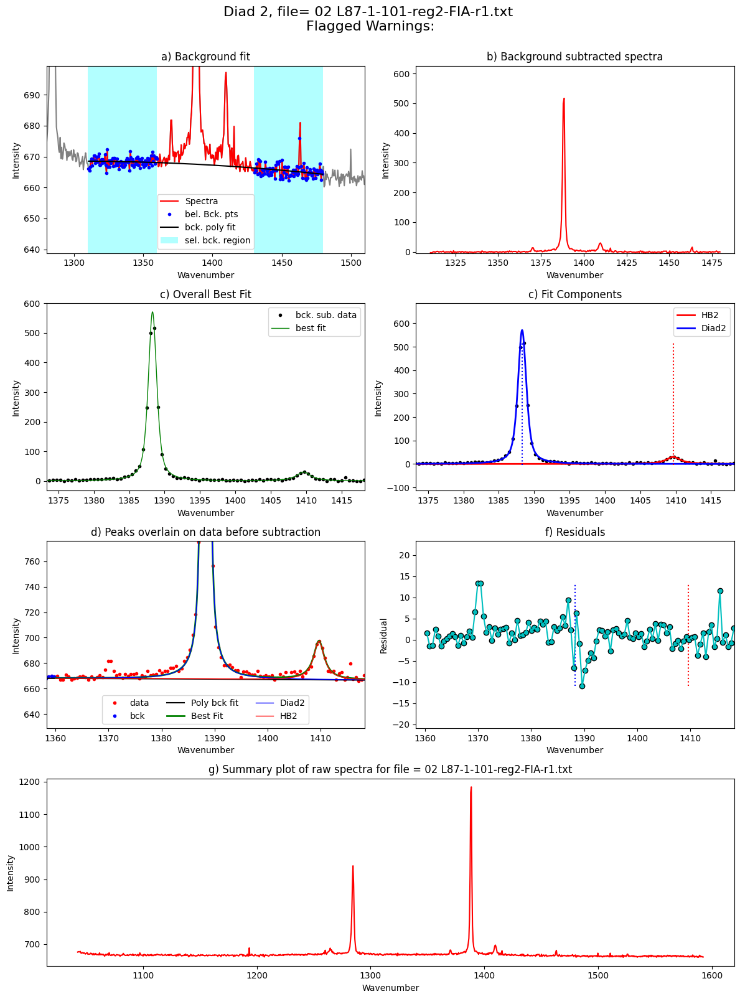

In [11]:
Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
    config2=diad_id_config,
path=spectra_path, filename=Diad_Files[i], filetype=spectra_filetype,
plot_figure=True, close_figure=False, 
Diad_pos=GroupN_df['Diad2_pos'].iloc[i],
HB_pos=GroupN_df['HB2_pos'].iloc[i], 
C13_pos=GroupN_df['C13_pos'].iloc[i])
Diad2_fit.to_clipboard(excel=True)
Diad2_fit

## Loop over all the files in the group
- This will loop over all the 

  0%|          | 0/27 [00:00<?, ?it/s]

Processing file: 02 L87-1-101-reg2-FIA-r1.txt


  4%|▎         | 1/27 [00:03<01:31,  3.53s/it]

Processing file: 03 L87-1-101-reg2-FIA-r2.txt


  7%|▋         | 2/27 [00:06<01:13,  2.92s/it]

Processing file: 04 L87-1-101-reg2-FIA-r3.txt


 11%|█         | 3/27 [00:08<01:07,  2.80s/it]

Processing file: 06 L87-1-101-reg2-FIB-r1.txt


 15%|█▍        | 4/27 [00:11<01:00,  2.62s/it]

Processing file: 07 L87-1-101-reg2-FIB-r2.txt


 19%|█▊        | 5/27 [00:13<00:56,  2.58s/it]

Processing file: 08 L87-1-101-reg2-FIB-r3.txt


 22%|██▏       | 6/27 [00:16<00:54,  2.59s/it]

Processing file: 10 L87-1-101-reg2-FIC-r1_CRR_DiadFit.txt


 26%|██▌       | 7/27 [00:18<00:51,  2.56s/it]

Processing file: 11 L87-1-101-reg2-FIC-r2.txt


 30%|██▉       | 8/27 [00:21<00:49,  2.62s/it]

Processing file: 12 L87-1-101-reg2-FIC-r3.txt


 33%|███▎      | 9/27 [00:24<00:47,  2.62s/it]

Processing file: 14 L87-1-101-reg1-FIA-r1.txt


 37%|███▋      | 10/27 [00:26<00:42,  2.53s/it]

Processing file: 15 L87-1-101-reg1-FIA-r2.txt


c:\users\charl\documents\python dev\diadfit\src\DiadFit\diads.py:3104: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axes=plt.subplot_mosaic(mosaic=figure_mosaic, figsize=(12, 16))
 41%|████      | 11/27 [00:28<00:39,  2.48s/it]

Processing file: 16 L87-1-101-reg1-FIA-r3.txt


 44%|████▍     | 12/27 [00:31<00:37,  2.48s/it]

Processing file: 17 L87-1-101-reg1-FIB-r1.txt


 48%|████▊     | 13/27 [00:33<00:33,  2.42s/it]

Processing file: 18 L87-1-101-reg1-FIB-r2_CRR_DiadFit.txt


 52%|█████▏    | 14/27 [00:35<00:31,  2.40s/it]

Processing file: 19 L87-1-101-reg1-FIB-r3_CRR_DiadFit.txt


 56%|█████▌    | 15/27 [00:37<00:27,  2.33s/it]

Processing file: 21 L87-1-101-reg1-FIC-r1.txt


 59%|█████▉    | 16/27 [00:40<00:25,  2.35s/it]

Processing file: 22 L87-1-101-reg1-FIC-r2_CRR_DiadFit.txt


 63%|██████▎   | 17/27 [00:42<00:22,  2.30s/it]

Processing file: 23 L87-1-101-reg1-FIC-r3.txt


 67%|██████▋   | 18/27 [00:45<00:21,  2.39s/it]

Processing file: 24 L87-1-101-reg3-FIA-r1.txt


 70%|███████   | 19/27 [00:47<00:19,  2.40s/it]

Processing file: 25 L87-1-101-reg3-FIA-r2.txt


 74%|███████▍  | 20/27 [00:50<00:17,  2.48s/it]

Processing file: 26 L87-1-101-reg3-FIA-r3.txt


 78%|███████▊  | 21/27 [00:53<00:15,  2.67s/it]

Processing file: 28 L87-1-101-reg3-FIB-r1.txt


 81%|████████▏ | 22/27 [00:56<00:14,  2.84s/it]

Processing file: 29 L87-1-101-reg3-FIB-r2.txt


 85%|████████▌ | 23/27 [00:59<00:11,  2.78s/it]

Processing file: 30 L87-1-101-reg3-FIB-r3.txt


 89%|████████▉ | 24/27 [01:02<00:08,  2.83s/it]

Processing file: 31 L87-1-101-reg3-FIC-r1.txt


 93%|█████████▎| 25/27 [01:04<00:05,  2.77s/it]

Processing file: 32 L87-1-101-reg3-FIC-r2.txt


 96%|█████████▋| 26/27 [01:07<00:02,  2.88s/it]

Processing file: 33 L87-1-101-reg3-FIC-r3_CRR_DiadFit.txt


100%|██████████| 27/27 [01:10<00:00,  2.61s/it]


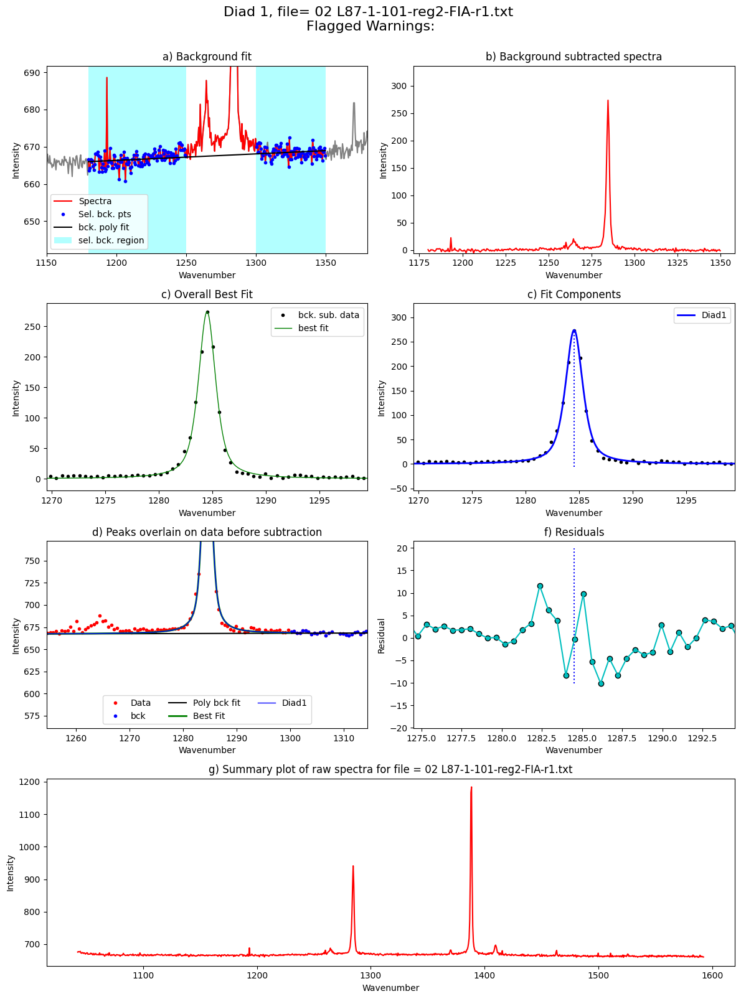

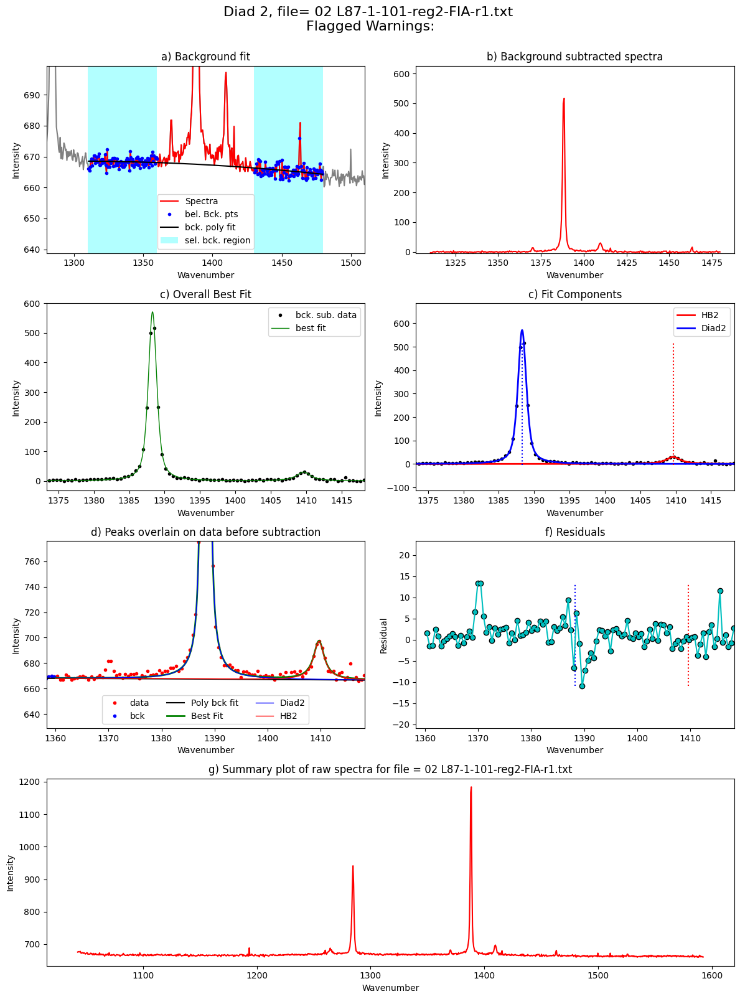

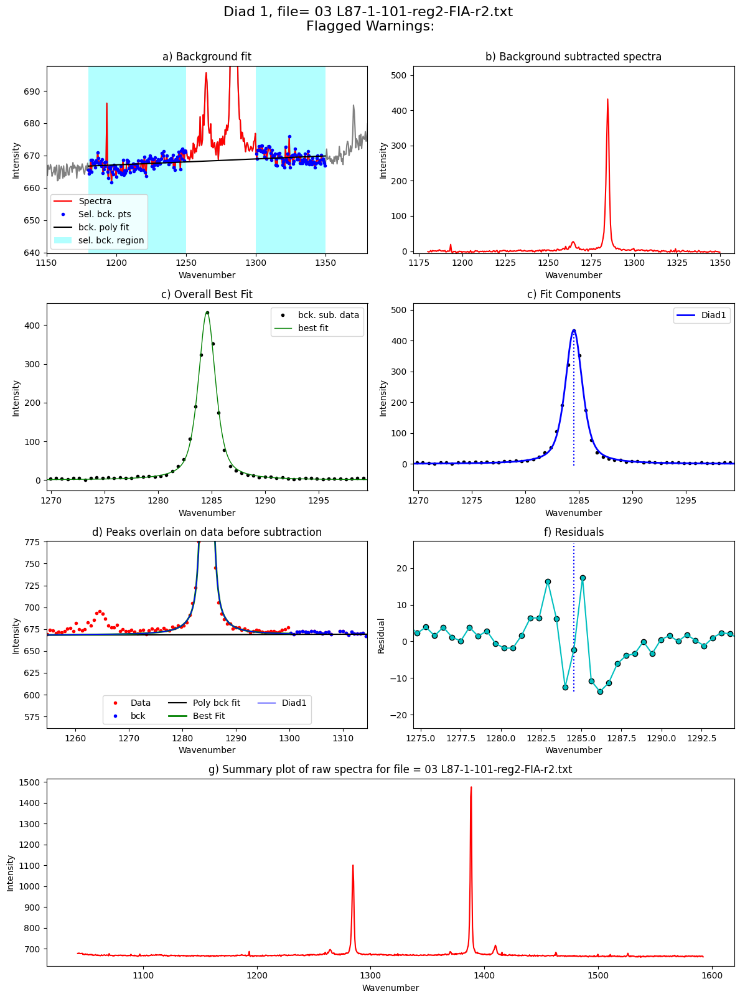

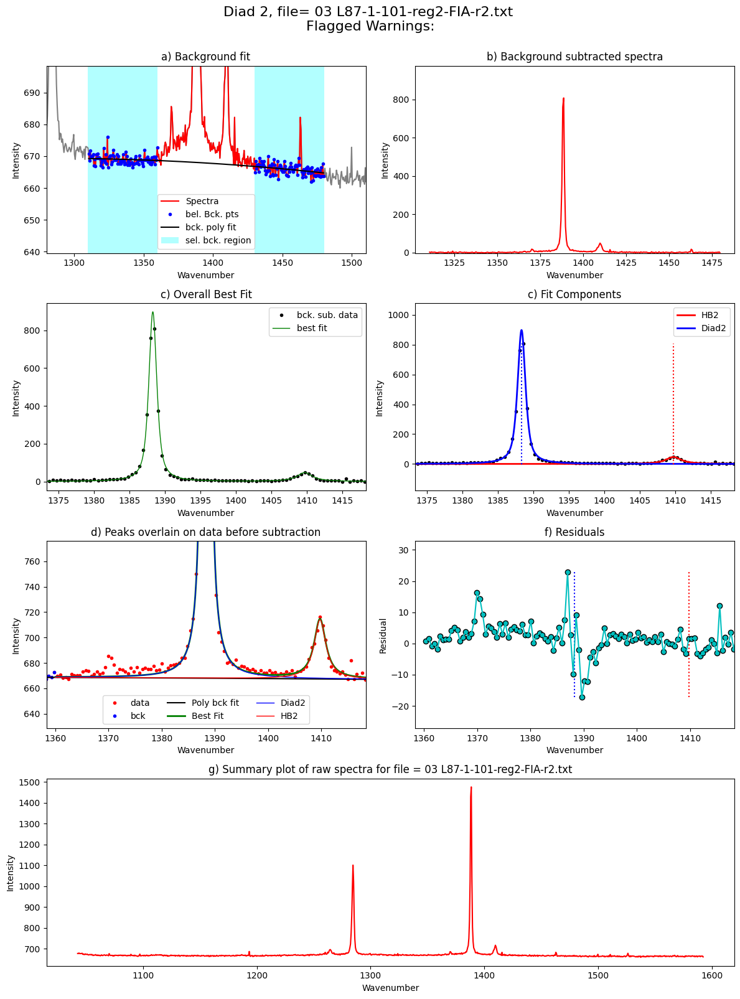

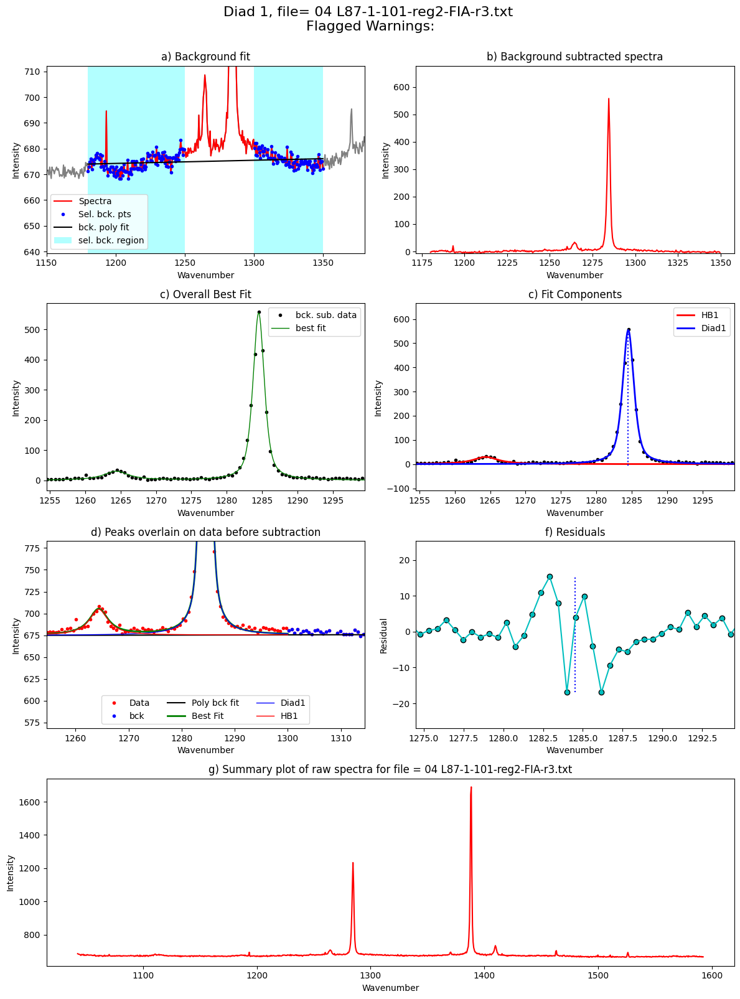

...

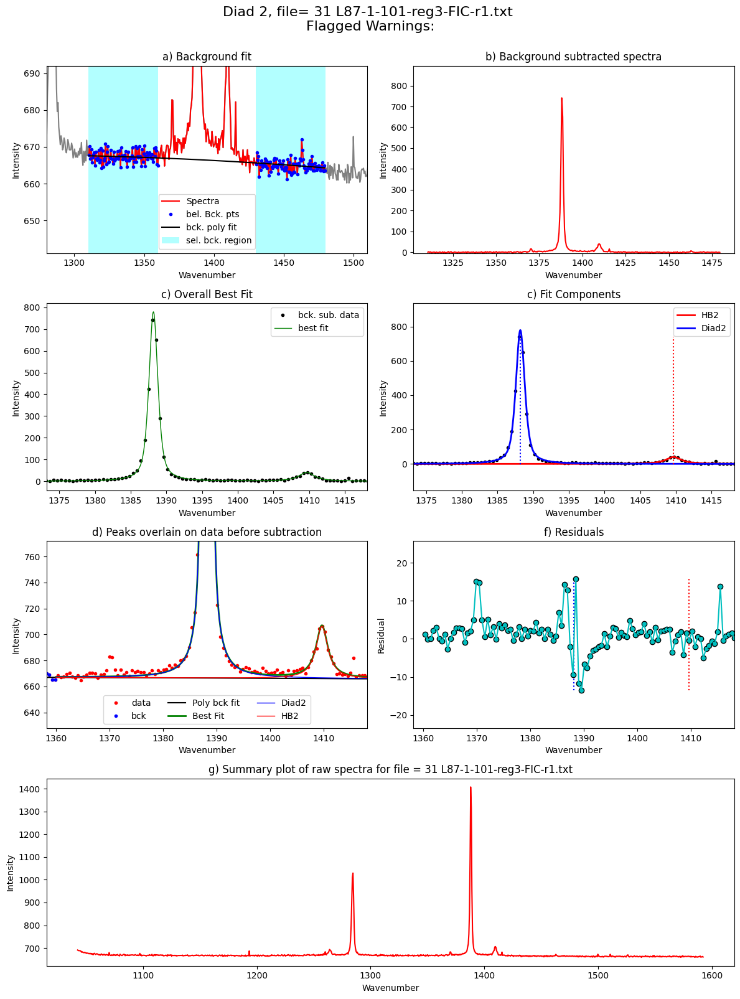

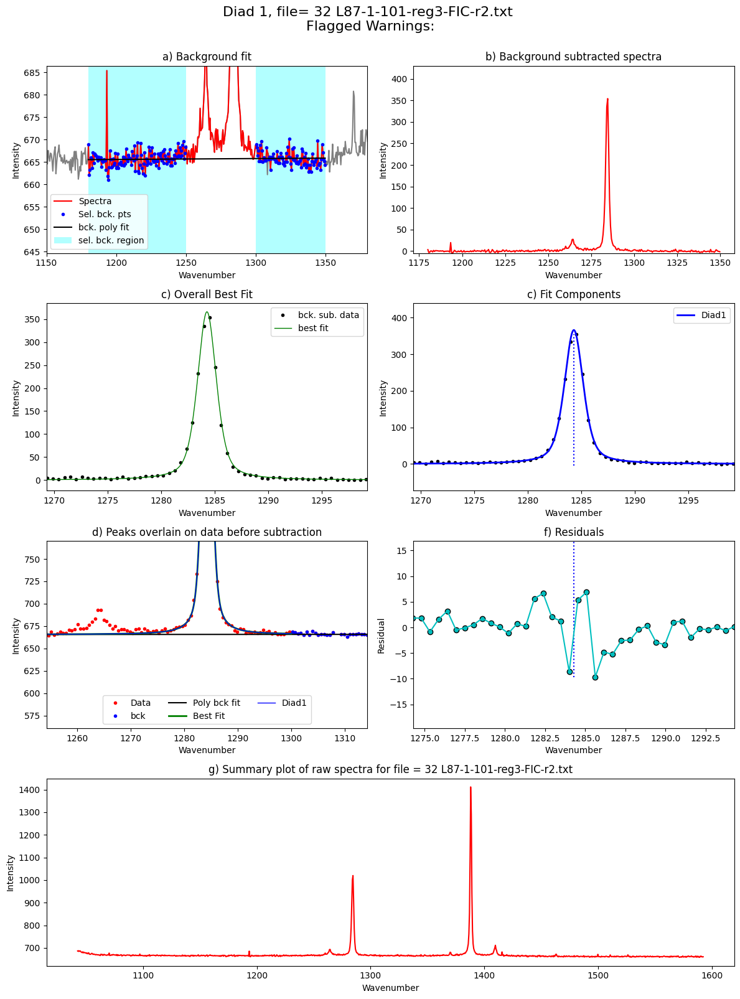

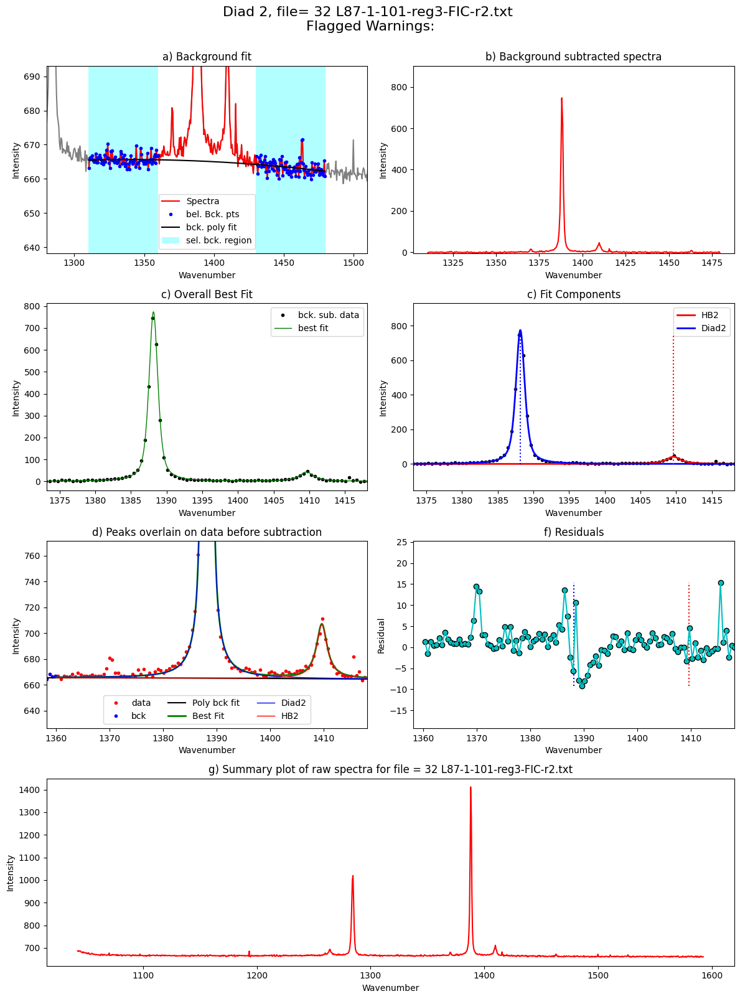

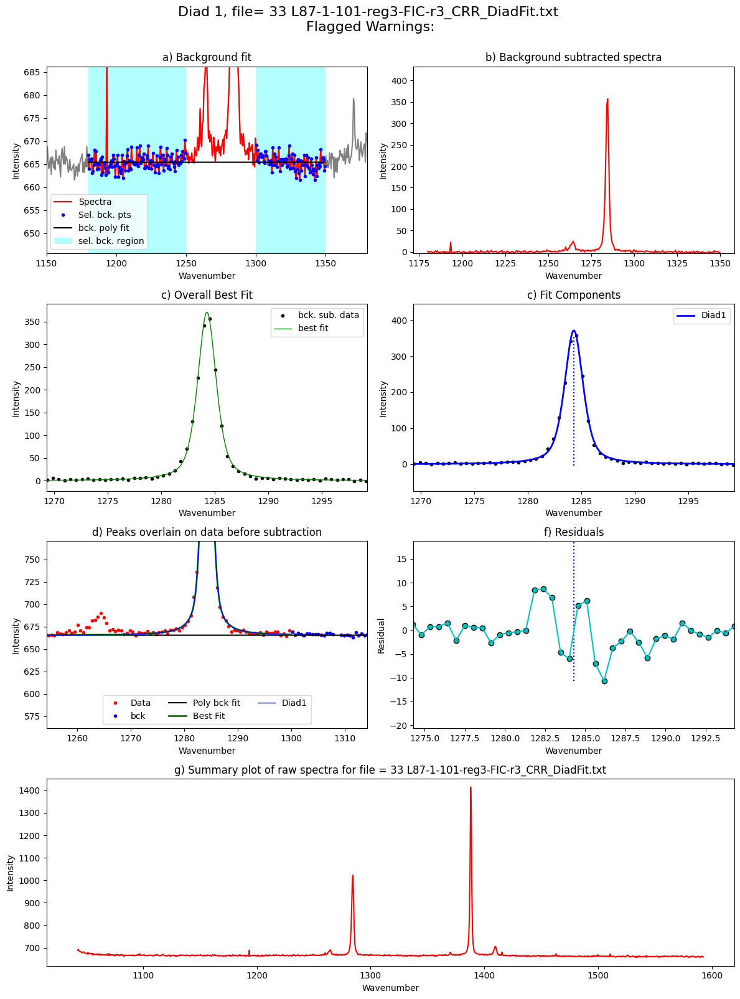

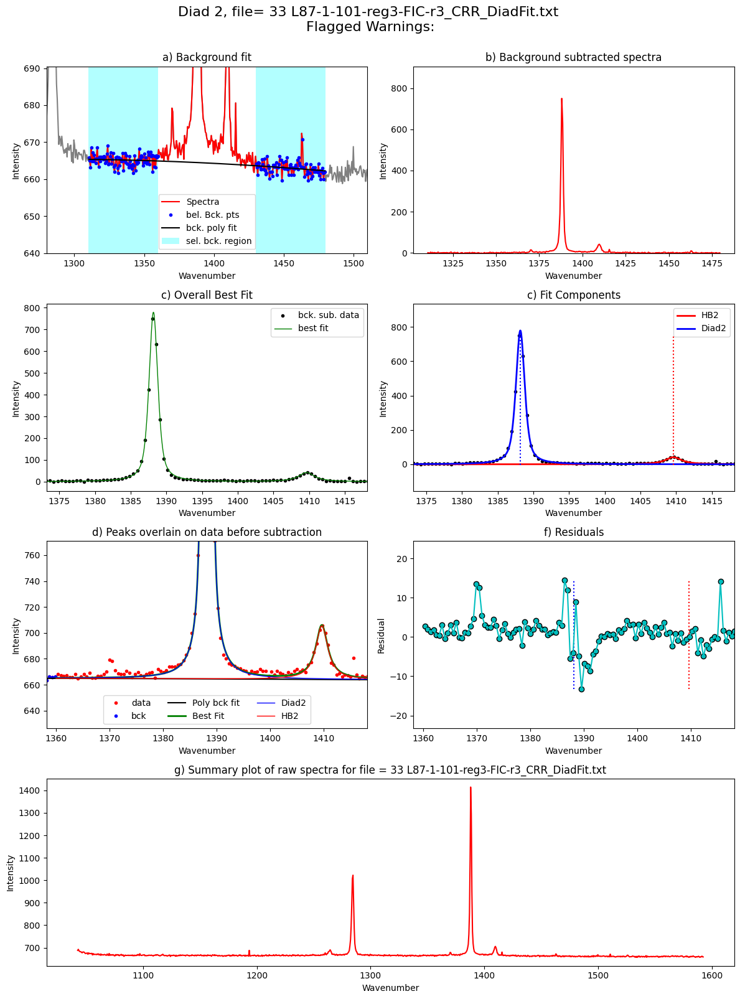

In [12]:
from tqdm import tqdm
plot_figure=True# If False, Means doesnt have to make figures, lot faster. 
close_figure=False # If True, wont show figures in notebook, but will still save them in a folder 
Diad_Files_i=Diad_Files
df_Merge = pd.DataFrame([])
for i in tqdm(range(0, len(Diad_Files))): #
    tqdm.write(f"Processing file: {Diad_Files[i]}")
    
    
    # For diad1, config file like you had in the previous. 
    # Only really used to exclude a range (say your spectra has a known spec)
    diad_id_config=pf.diad_id_config(exclude_range1=[1308, 1309])
    
    # Here, the prominence are taken from the fitting in the last notebook
    diad1_fit_config2.HB_prom=GroupN_df['HB1_abs_prom'].iloc[i]
    diad1_fit_config2.diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i]
    diad1_fit_config2.gauss_amp=2*GroupN_df['HB1_abs_prom'].iloc[i]

    Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config2,
    config2=diad_id_config, path=spectra_path, filename=GroupN_df['filename'].iloc[i],
    filetype=spectra_filetype, plot_figure=plot_figure, close_figure=close_figure,
    Diad_pos=GroupN_df['Diad1_pos'].iloc[i],
    HB_pos=GroupN_df['HB1_pos'].iloc[i])

    ## Same for diad2, just also has a C13 peak
    diad2_fit_config_init.HB_prom=GroupN_df['HB2_abs_prom'].iloc[i]
    diad2_fit_config_init.diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i]
    diad2_fit_config_init.gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i]
    diad2_fit_config_init.C13_prom=GroupN_df['C13_abs_prom'].iloc[i]
    
    
    Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
        config2=diad_id_config,
    path=spectra_path, filename=GroupN_df['filename'].iloc[i], 
    filetype=spectra_filetype,
    plot_figure=plot_figure, close_figure=close_figure,
    Diad_pos=GroupN_df['Diad2_pos'].iloc[i],
    HB_pos=GroupN_df['HB2_pos'].iloc[i], 
    C13_pos=GroupN_df['C13_pos'].iloc[i])
    
    # This combines the outputs into a single dataframe
    data=pf.combine_diad_outputs(filename=GroupN_df['filename'].iloc[i], prefix=prefix, 
    Diad1_fit=Diad1_fit, path=spectra_path,                  
    Diad2_fit=Diad2_fit)        
    
 

    df_Merge = pd.concat([df_Merge, data], axis=0).reset_index(drop=True)


In [13]:
# Save parameters to excel
combo=df_Merge

if batch=='Weak':
    combo.to_excel('Weak_Diads.xlsx', index=False)
if batch=='Medium':
    combo.to_excel('Medium_Diads.xlsx', index=False)
if batch=='Strong':
    combo.to_excel('Strong_Diads.xlsx', index=False)

In [14]:
combo

,filename,Splitting,Split_σ,Diad1_Combofit_Cent,Diad1_cent_err,Diad1_Combofit_Height,Diad1_Voigt_Cent,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Residual,...,Diad1_Asym50,Diad1_Asym70,Diad1_Yuan2017_sym_factor,Diad1_Remigi2021_BSF,Diad2_Asym50,Diad2_Asym70,Diad2_Yuan2017_sym_factor,Diad2_Remigi2021_BSF,Diad1_PDF_Model,Diad2_PDF_Model
0,L87-1-101-reg2-FIA-r1,103.785325,0.010444,1284.515590,0.009991,273.793109,1284.515590,734.360415,0.960012,3.878183,...,1.140449,1.200549,0.269666,0.007013,1.078571,1.104530,0.111680,0.002488,PseudoVoigtModel,PseudoVoigtModel
1,L87-1-101-reg2-FIA-r2,103.774216,0.008526,1284.540397,0.008163,434.277647,1284.540397,1137.385957,0.951451,5.191029,...,1.149140,1.245442,0.283798,0.004382,1.097990,1.122711,0.131355,0.001493,PseudoVoigtModel,PseudoVoigtModel
2,L87-1-101-reg2-FIA-r3,103.788511,0.005693,1284.520725,0.005116,554.506323,1284.520775,1448.447774,0.952352,3.505115,...,1.085028,1.151678,0.161953,0.003435,1.089157,1.101754,0.126009,0.001265,PseudoVoigtModel,PseudoVoigtModel
3,L87-1-101-reg2-FIB-r1,103.879465,0.011649,1284.261720,0.010702,261.512386,1284.261720,770.284171,1.052783,3.399991,...,1.179756,1.249066,0.378487,0.008051,1.047619,1.032051,0.071686,0.002731,PseudoVoigtModel,PseudoVoigtModel
4,L87-1-101-reg2-FIB-r2,103.908291,0.006394,1284.234292,0.005627,548.451713,1284.234342,1556.222592,1.049812,3.765897,...,1.177391,1.188442,0.372455,0.003828,1.013216,1.050162,0.020070,0.001312,PseudoVoigtModel,PseudoVoigtModel
5,L87-1-101-reg2-FIB-r3,103.923515,0.006240,1284.201460,0.005516,549.715668,1284.201510,1593.307952,1.087278,3.643016,...,1.250429,1.239348,0.544571,0.003956,1.028634,1.027027,0.043849,0.001311,PseudoVoigtModel,PseudoVoigtModel
6,L87-1-101-reg2-FIC-r1_CRR_DiadFit,103.804736,0.005731,1284.475496,0.005175,570.429909,1284.475546,1537.752489,0.983200,3.406466,...,1.188679,1.293872,0.371019,0.003447,1.023364,1.068611,0.033017,0.001190,PseudoVoigtModel,PseudoVoigtModel
7,L87-1-101-reg2-FIC-r2,103.819896,0.005442,1284.450052,0.004803,587.252123,1284.450102,1573.351279,0.977348,3.758204,...,1.121771,1.228997,0.238026,0.003329,1.030233,1.075214,0.042946,0.001187,PseudoVoigtModel,PseudoVoigtModel
8,L87-1-101-reg2-FIC-r3,103.827366,0.005019,1284.444387,0.004273,597.400236,1284.444437,1586.572968,0.972384,3.250853,...,1.131238,1.204082,0.255228,0.003255,1.082547,1.112457,0.118562,0.001192,PseudoVoigtModel,PseudoVoigtModel
9,L87-1-101-reg1-FIA-r1,103.746428,0.007746,1284.611596,0.007456,492.727523,1284.611596,1232.561767,0.909226,5.275791,...,1.024299,1.076923,0.044187,0.003691,1.139535,1.110906,0.186631,0.001316,PseudoVoigtModel,PseudoVoigtModel


### This plays a sound when the notebook is done if you have a tendency to procrastinate

In [15]:
# !pip install winotify

from winotify import Notification, audio

toast= Notification(app_id="VSCode",title="Notebook completed",
                    msg="Step3b_Secondary_Peaks is done!",
                    duration="short")
toast.set_audio(audio.Mail,loop=False)
toast.show()